In [1]:
from moviepy.editor import *

In [2]:
BunnyMovie = VideoFileClip('media/big_buck_bunny_480p_surround-fix.avi')

# Сцена1 - Intro

###  TextClip  - создание титров и наложение на видео

- fontsize
- color  --->  Hex color ex. #ffffff  ex. red, cyan, yellow
- stroke_color
- stroke_width
- font
- .set_position(x/y) 
- .set_duration(секунды)
- .set_start(начало)


- .subclip(start, end) вырезать фрагмент "01:04:32"
- CompositeVideoClip([clip1, clip2...]) объединить клипы
- .fadein(секунда) затемнение входы и выхода .fadeout()

In [3]:
texts = ["UfaDevConf", "14 октября 2017"]
font = 'Arial'
fontsize = 60


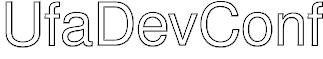

In [4]:
sub_text1 = TextClip(
                    texts[0], 
                    fontsize=fontsize, 
                    color='white', 
                    stroke_color="#000", 
                    stroke_width=1,
                    font=font
                )
ipython_display(sub_text1)

In [5]:
sub_text2 = TextClip(
                    texts[1], 
                    fontsize=fontsize/2, 
                    color='yellow',
                    font=font
                )
ipython_display(sub_text2)

In [6]:
# TextClip 
sub_text1 = sub_text1.set_position((60, 230))
sub_text2 = sub_text2.set_position((60, 300))

text_1 = CompositeVideoClip([sub_text1, sub_text2], size=BunnyMovie.size).set_duration(3)
ipython_display(text_1, width=480, fps=15)

 98%|█████████▊| 45/46 [00:01<00:00, 23.37it/s]



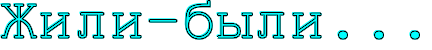

In [7]:
# methods (ex. clip.set_pos().set_duration()...)
text_2 = TextClip(
                "Жили-были...", 
                fontsize=60, 
                color='cyan', 
                stroke_color="#000000",
                stroke_width=1
            ).set_pos(("center", 300)).set_duration(2).set_start(4)

ipython_display(text_2)

In [8]:
# вырезаем фрагмент из исходника, например с 0 до 8 секунды
cut_BM = BunnyMovie.subclip(0, 8)
ipython_display(cut_BM, width=480, fps=15)

 99%|█████████▉| 120/121 [00:03<00:00, 30.69it/s]


In [9]:
#собираем всё
screen_1 = CompositeVideoClip([cut_BM, text_1, text_2]).fadein(1)

ipython_display(screen_1, width=480, fps=15)

 99%|█████████▉| 120/121 [00:12<00:00, 21.69it/s]


### Screen 2: 影片物理特效與圖片

影片特效作法：
- new_clip = clip.fx( vfx.effect_func, parameter1=... ) 


- new_clip = effect_func( clip, parameter1=... )

MoviePy 內建特效： http://zulko.github.io/moviepy/ref/videofx.html

也可以自訂特效函數！(對每個影格的 RGB array 做計算)

Screen2 特效:

- 鏡像反射 vfx.mirror_x, vfx.mirror_y
- 組合畫面 clips_array([ [ clip_0, clip_1 ], [ clip_2, clip_3 ] ])
- 縮放大小 clip.resize(...) 可以指定倍數 ex. 0.5, 可以設定長寬 (1280, 720), 或是等比例縮放 width=1280 
- 切畫面 vfx.crop( x1 = 100, x2 = 500, y1 = 200, y2 = 400 )
- 調整亮度 vfx.colorx, factor = 1.5 變亮 1.5 倍 ( < 1 則是變暗 )
- 調整速度 vfx.speed, factor = 0.4 變為 0.4 倍速

#### 影片控制

- 圖片 ImageClip(檔案路徑)
- 串接影片 concatenate_videoclips

In [10]:
text_3 = TextClip("UFA", 
                  fontsize=80, 
                  color='red', 
                  stroke_color="#000000", 
                  stroke_width=1,
                  font=font
                 ).set_pos(("center", 300))

# 正常
clip0 = CompositeVideoClip([BunnyMovie.subclip(15, 16.5), text_3.set_duration(1.5)])

# 把螢幕切分四個子畫面 每個子畫面都做鏡像反射 ( mirror_x, mirror_y ) 再組合
clip = CompositeVideoClip([BunnyMovie.subclip(16.5, 17.5), text_3.set_duration(1)])
clip1 = clips_array([[clip.fx(vfx.mirror_x), clip],
                     [clip.fx(vfx.mirror_y).fx(vfx.mirror_x), clip.fx(vfx.mirror_y)]]).resize(clip.size)

# 切畫面 再resize回原大小 最後把亮度增加 1.5 倍 
clip2 = clip.fx(vfx.crop, x1=60, y1=30, x2=480, y2=240).resize(clip.size).fx(vfx.colorx, 1.5)

# 將影片速度放慢到 0.4 倍 再和圖片合成
img = ImageClip('images/like.png').resize(2)
clip3 = CompositeVideoClip([clip.fx(vfx.speedx, 0.4), img.set_pos((300, 50)).set_duration(1.5).set_start(0.5)])

# 將上面四個短片 串接 成一個影片
screen_2 = concatenate_videoclips([clip0, clip1, clip2, clip3])

ipython_display(screen_2, width=480, fps=15)

 99%|█████████▉| 90/91 [00:22<00:00,  4.95it/s]


### Screen 3

- 調整聲音大小 .volumex( 倍數 )
- resize進階用法：隨時間而變 .resize( lambda t: f ( t ) )

In [11]:
# ##################### 字幕 #####################
text_4 = TextClip(" 有喔", fontsize=60, color='cyan', stroke_color="#000000", stroke_width=1,
                 font=font).set_pos(("center", 300)).set_duration(1).set_start(2)

text_5 = TextClip(" 正點！", fontsize=80, color='yellow', stroke_color="#000000", stroke_width=1,
                 font=font).set_pos(("center", 300)).set_duration(1).set_start(3.2)
# ##################### 字幕 #####################

# 圖片逐漸放大
img = ImageClip('images/power.jpg').set_duration(1.5).set_start(0.5).resize(lambda t: 1 + 0.3*t).set_pos((50, 100))

# 音量調為兩倍
screen_3 = CompositeVideoClip([BunnyMovie.subclip(6, 10.2), text_4, text_5, img]).volumex(2)

ipython_display(screen_3, width=480, fps=15)

 98%|█████████▊| 63/64 [00:03<00:00, 18.98it/s]


### Screen 4


In [29]:
# ##################### титры #####################
def titler(text, start, duration):
    result = TextClip(
            str(text), 
            fontsize=fontsize, 
            color='white', 
            stroke_color="#000000", 
            stroke_width=1,
            font=font
        ).set_pos(("center", "center")).set_duration(float(duration)).set_start(float(start))
    return result

text_6 = titler('Как хорошо в Уфе', start=2, duration=4)


# ##################### 字幕 #####################

screen_4 = CompositeVideoClip([BunnyMovie.subclip(10, 14), text_6])

ipython_display(screen_4, width=480, fps=15)

 99%|█████████▉| 90/91 [00:04<00:00, 19.09it/s]


### Screen 5

### Screen 6

### Screen 7 - 1

In [15]:
# ##################### 字幕 #####################
text_42 = TextClip(" 妳敢不敢...", fontsize=60, color='cyan', stroke_color="#000000", stroke_width=1,
                 font=font).set_pos(("center", 600)).set_duration(1.8).set_start(0.4)

text_43 = TextClip(" 跟我接吻", fontsize=60, color='cyan', stroke_color="#000000", stroke_width=1,
                 font=font).set_pos(("center", 600)).set_duration(1.5).set_start(3.3)

text_44 = TextClip(" 什麼？！", fontsize=70, color='yellow', stroke_color="#000000", stroke_width=1,
                 font=font).set_pos(("center", 595)).set_duration(0.8).set_start(9)
# ##################### 字幕 #####################

screen_7_1 = CompositeVideoClip([BunnyMovie.subclip("00:04:55.7", "00:05:05.7"), text_42, text_43, text_44])

ipython_display(screen_7_1, width=480, fps=15)

 99%|█████████▉| 150/151 [00:07<00:00, 20.61it/s]
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


### Screen 7 - 2
- 時間鏡像(倒著播) vfx.time_mirror 
- 淡出 fadeout( 秒數 )

In [21]:

text_53 = TextClip(" 敬友誼！", fontsize=60, color='cyan', stroke_color="#000000", stroke_width=1,
                 font=font).set_pos(("center", 600)).set_duration(1.5).set_start(23.5)

text_54 = TextClip(" 還有親親", fontsize=60, color='cyan', stroke_color="#000000", stroke_width=1,
                 font=font).set_pos(("center", 600)).set_duration(1.5).set_start(25.5)
# ##################### 字幕 #####################

screen_7_2 = CompositeVideoClip([BunnyMovie.subclip("00:05:24.3", "00:05:53"), text_45, text_46, text_47,
                                 text_48, text_49, text_50, text_51, text_52, text_53, text_54])

sub_clip = BunnyMovie.subclip("00:05:50.3", "00:05:53")
sub_clip2 = sub_clip.fx(vfx.time_mirror)

# 加速 與 時間鏡像 與 變亮 與 淡出
clip1 = concatenate_videoclips([sub_clip2.speedx(1.2), sub_clip.speedx(1.5).fx(vfx.colorx, 1.2)])
clip2 = concatenate_videoclips([sub_clip2.speedx(1.8).fx(vfx.colorx, 1.3), sub_clip.speedx(2).fx(vfx.colorx, 1.5)])
ending = concatenate_videoclips([clip1, clip2]).fadeout(1)

screen_7_2 = concatenate_videoclips([screen_7_2, ending])

ipython_display(screen_7_2, width=480, fps=15)

100%|██████████| 534/534 [01:18<00:00,  8.42it/s]
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


### Final Step : 串接影片 大功告成
- 輸出 .write_video( myvideo.mp4, fps=24 )

可輸出 .mkv, .mp4, .....

可供設定： fps, codec, bitrate, audio=True, audio_fps, audio_nbytes, audio_codec, audio_bitrate.....
#### 輸出時間正比於解析度！ 輸出 720p 約為 360p 的 4 倍時間

- ipython_display 有影片長度限制 120 秒，設定 maxduration 以擺脫限制

In [17]:
final_movie = concatenate_videoclips([screen_1, screen_2, screen_3, screen_4, screen_5, screen_6,
                                      screen_7_1, screen_7_2])

# 設定 maxduration
ipython_display(final_movie, width=480, fps=15, maxduration=1000)

100%|██████████| 2123/2123 [03:11<00:00, 11.06it/s]
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [18]:
final_movie.write_videofile("taipeipy_demo.mp4", fps=24)

[MoviePy] >>>> Building video taipeipy_demo.mp4
[MoviePy] Writing audio in taipeipy_demoTEMP_MPY_wvf_snd.mp3


100%|██████████| 3121/3121 [00:39<00:00, 78.46it/s] 


[MoviePy] Done.
[MoviePy] Writing video taipeipy_demo.mp4


100%|██████████| 3396/3396 [07:14<00:00,  6.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: taipeipy_demo.mp4 



### 更多詳見官網： http://zulko.github.io/moviepy/index.html